In [1]:
import numpy as np
import time
from glob import glob
from natsort import natsorted
from skimage.measure import label
from skimage.segmentation import relabel_sequential
import matplotlib.pyplot as plt

from metrics import evaluate 
from utils import *
import cv2, os

In [2]:
meds = ["graphcl", "rec", "maskrcnn"]
len_test = 100

In [3]:
graphcl_path = natsorted (glob ('/home/tuan/GraphCL3D/deploy/160_mnseg2018//test/*.tif')) [:len_test]
rec_path = natsorted (glob ('/home/tuan/rec-attend-public-all/rec-monuseg-160/results/full_model_cvppp-20200816185847/output_valid/30/*.png')) [-len_test:]
maskrcnn_path = natsorted (glob ('/home/tuan/Mask_RCNN/results/monuseg_160/submit_20200830T071804/*.tif')) [:len_test]

gt_path = natsorted (glob ('/home/tuan/Data/MoNuSeg2018/160/test/B/*.tif')) 
em_path = natsorted (glob ('/home/tuan/Data/MoNuSeg2018/160/test/A/*.tif'))

In [30]:
# Test obj counts:
gt_path_tmp = natsorted (glob ('/home/tuan/Data/MoNuSeg2018/224/test/B/*.tif')) 
tmp = [io.imread (pth) for pth in gt_path_tmp]
print ("avg. test count", np.mean ([len (np.unique (x)) for x in tmp]))

gt_path_tmp = natsorted (glob ('/home/tuan/Data/MoNuSeg2018/224/train/B/*.tif')) 
tmp = [io.imread (pth) for pth in gt_path_tmp]
print ("avg. test count", np.mean ([len (np.unique (x)) for x in tmp]))

gt_path_tmp = natsorted (glob ('/home/tuan/Data/MoNuSeg2018/224/valid/B/*.tif')) 
tmp = [io.imread (pth) for pth in gt_path_tmp]
print ("avg. test count", np.mean ([len (np.unique (x)) for x in tmp]))

avg. test count 121.3
avg. test count 182.238
avg. test count 196.07


In [4]:
graphcl = [io.imread (pth) for pth in graphcl_path]
rec = [io.imread (pth) for pth in rec_path]
print (rec [0].shape)
rec = [(img [...,0] * (256 ** 2)).astype (np.int32) + img [...,1] * 256 + img [...,2] for img in rec]
rec = [relabel_sequential (img) [0] for img in rec]
maskrcnn = [io.imread (pth) for pth in maskrcnn_path]
em =  [io.imread (pth) for pth in em_path]
gt = [io.imread (pth) for pth in gt_path]

(160, 160, 3)


In [14]:
gt_median_sizes = [np.median(np.unique (img, return_counts=True)[1]) for img in gt]
print (gt_median_sizes)
print ("Mean ", np.min (gt_median_sizes))

[454.0, 313.0, 761.0, 447.0, 496.0, 401.0, 707.0, 389.0, 115.0, 101.0, 766.5, 103.0, 433.5, 433.5, 633.0, 408.0, 500.5, 89.0, 652.0, 835.5, 794.0, 934.0, 299.0, 102.5, 509.0, 866.0, 109.5, 110.0, 606.0, 276.5, 331.0, 616.0, 84.0, 670.0, 879.5, 370.0, 88.0, 339.0, 472.0, 302.0, 609.0, 640.0, 85.0, 374.0, 722.0, 696.0, 396.0, 110.0, 111.0, 548.0, 737.0, 601.0, 80.0, 724.5, 381.0, 858.0, 365.5, 292.0, 357.0, 98.0, 760.0, 447.0, 760.0, 118.0, 903.0, 111.5, 313.5, 346.0, 470.5, 679.5, 319.0, 433.0, 85.0, 438.0, 344.5, 104.0, 584.0, 429.0, 872.5, 315.0, 98.0, 926.0, 463.0, 506.0, 96.0, 93.5, 848.0, 69.0, 88.5, 313.5, 66.0, 763.0, 631.5, 654.0, 845.0, 101.0, 110.0, 615.0, 123.0, 593.0]
Mean  66.0


In [5]:
paths = [graphcl_path, rec_path, maskrcnn_path]
res = [graphcl, rec, maskrcnn]

In [6]:
#Post-processing GraphCL
metrics = ["bestDice", "rand_i", "voi_split", "voi_merge", "adapted_rand", "AJI"]
minsize = 10
scores = np.zeros (len (metrics))

post_processed = []
post_proc_time = 0

for i in range (len_test):
    curtime = time.time ()
    pred_lbl = label (graphcl [i])
    gt_lbl = gt [i]
    pred_lbl = relabel_sequential (clean (pred_lbl, minsize)) [0]
    post_processed += [pred_lbl]
    post_proc_time += time.time () - curtime
    
    size = gt_lbl.shape
    pred_lbl = cv2.resize (pred_lbl.astype (np.int32), size, interpolation=cv2.INTER_NEAREST)
    
    scores += np.array (evaluate (pred_lbl, gt_lbl))

avg_post_proc_time = post_proc_time / len_test
scores /= len_test
    
for met, score in zip (metrics, scores):
    print (met, ":\t", score)
print ("Post processing time: ", avg_post_proc_time)

bestDice :	 0.6667579739170995
rand_i :	 0.6667192860798521
voi_split :	 0.6570438196361298
voi_merge :	 1.2223194594817162
adapted_rand :	 0.26125046133551505
AJI :	 0.5573756565844421
Post processing time:  0.0010522961616516112


In [7]:
graphcl = post_processed 


In [8]:
tmp = []
for med, met, lbl_lists in zip (meds, metrics, res):
    if med == 'graphcl':
        continue
    scores = np.zeros (len (metrics))
    for i in range (len_test):
        gt_lbl = gt [i]
        pred_lbl = relabel_sequential (lbl_lists [i]) [0]
        size = gt_lbl.shape
        pred_lbl = cv2.resize (pred_lbl.astype (np.int32), size, interpolation=cv2.INTER_NEAREST)
        scores += np.array (evaluate (pred_lbl, gt_lbl))
        lbl_lists [i] = pred_lbl
    tmp += [lbl_lists]
    scores /= len_test
    print (med)
    for met, score in zip (metrics, scores):
        print (met, ":\t", score)
    print ('-' * 60)
rec, maskrcnn = tmp

rec
bestDice :	 0.28482041043608886
rand_i :	 0.32989989461822716
voi_split :	 0.954131554261843
voi_merge :	 3.7922103385240833
adapted_rand :	 0.7797891498665596
AJI :	 0.11002051821356952
------------------------------------------------------------
maskrcnn
bestDice :	 0.5117996717663751
rand_i :	 0.5147632394275053
voi_split :	 0.808135808984977
voi_merge :	 2.324211633838907
adapted_rand :	 0.5460526134508057
AJI :	 0.4127610534542216
------------------------------------------------------------


25


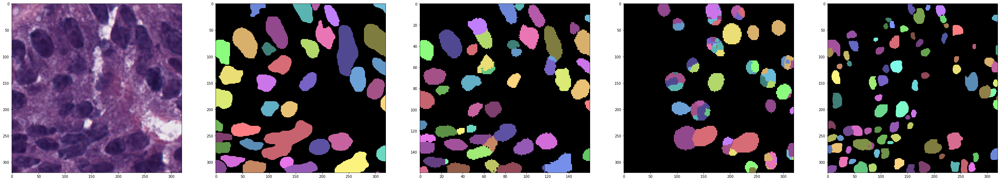

26


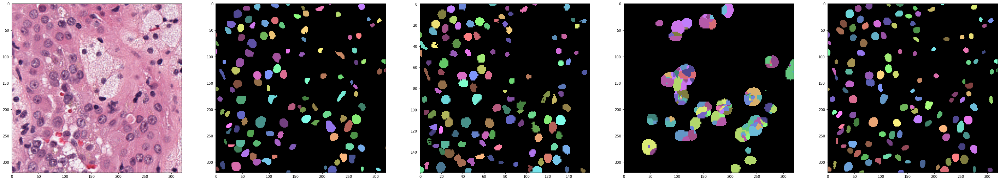

27


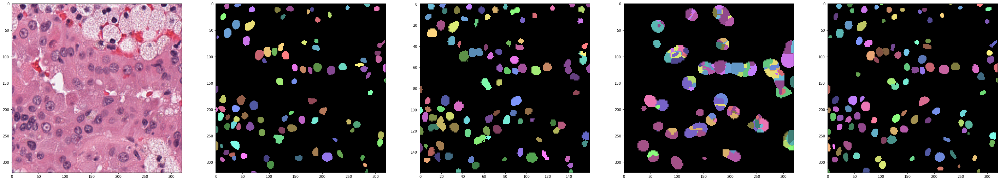

28


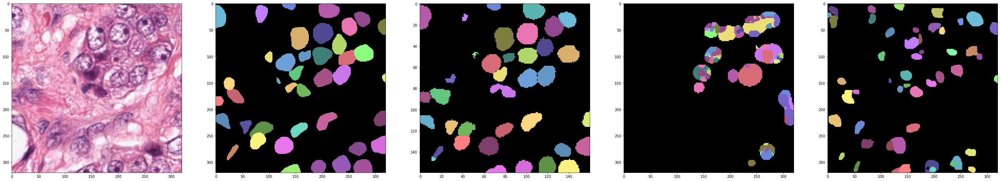

29


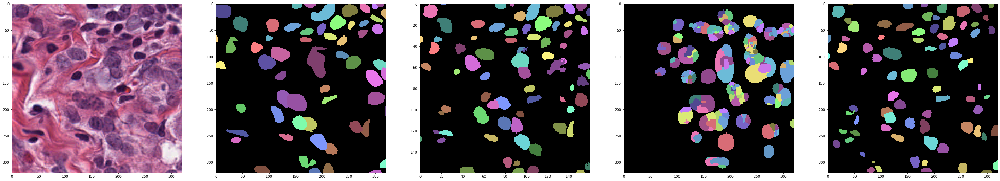

30


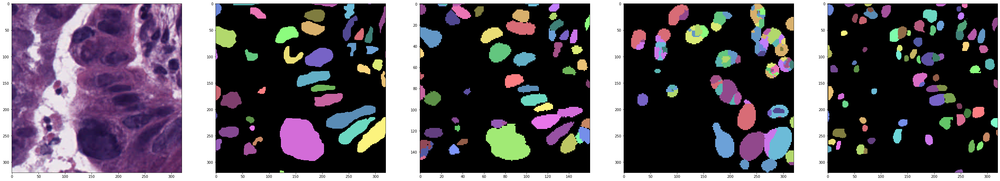

31


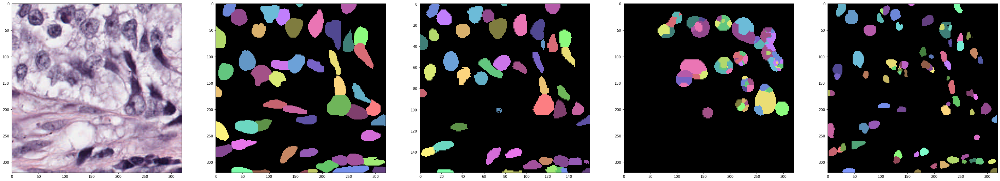

32


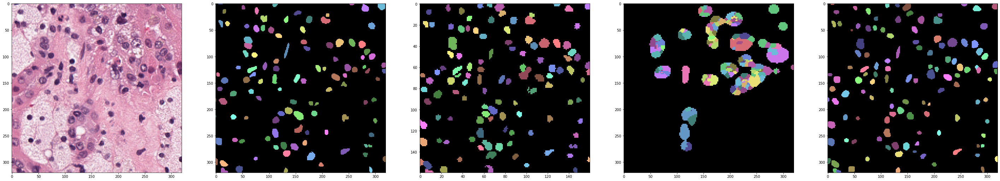

33


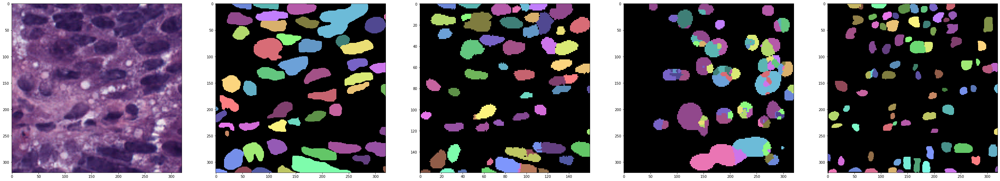

34


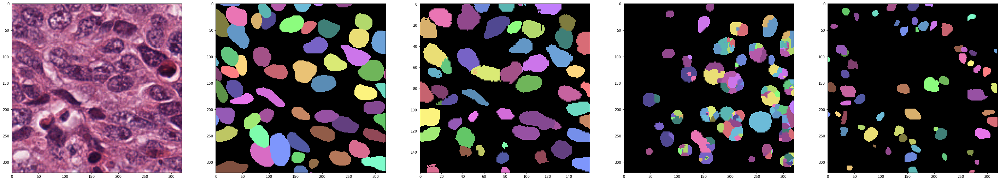

35


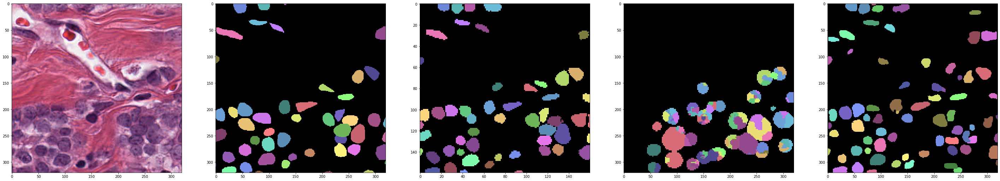

36


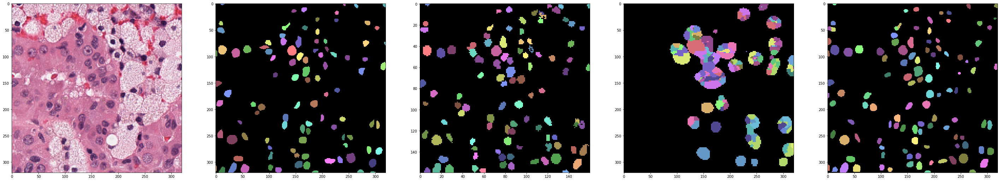

37


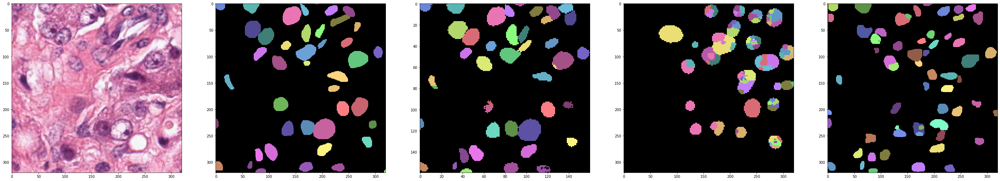

38


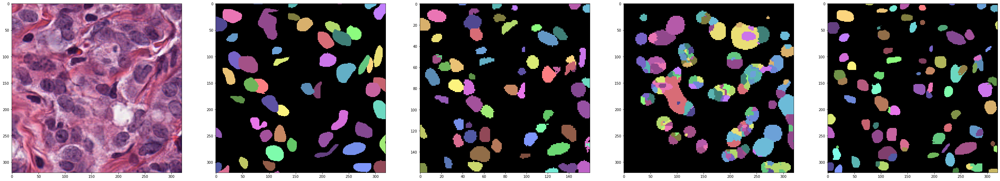

39


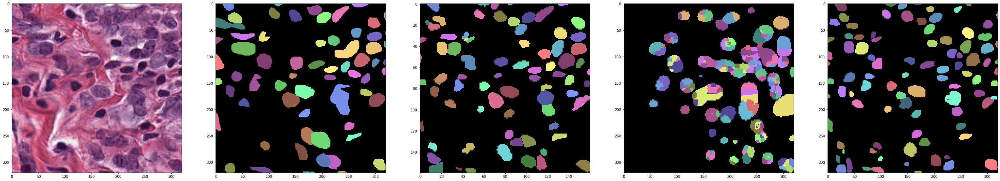

40


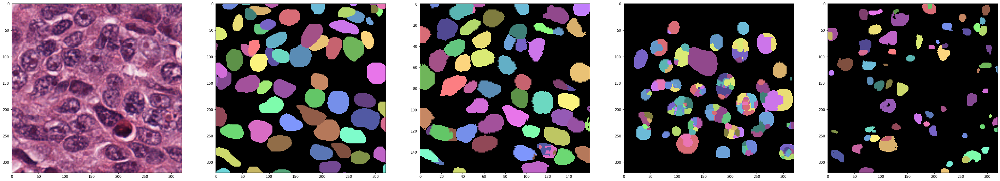

41


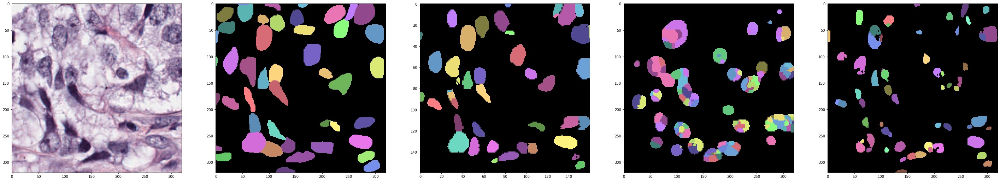

42


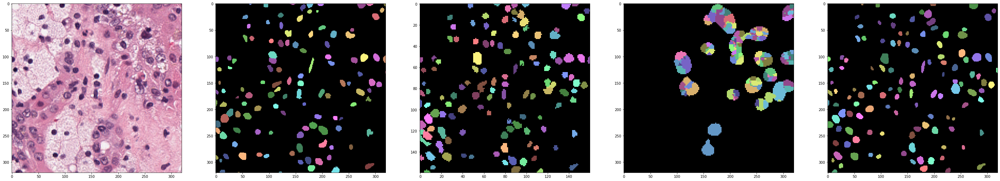

43


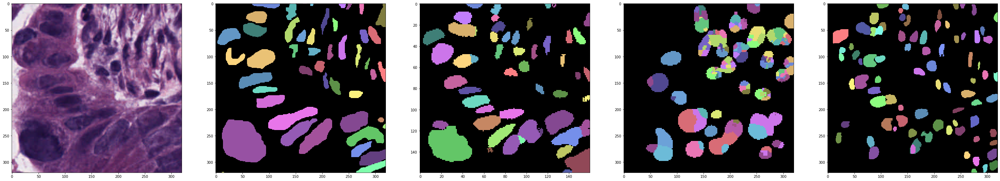

44


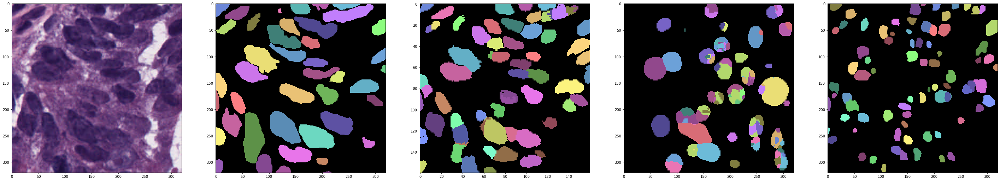

45


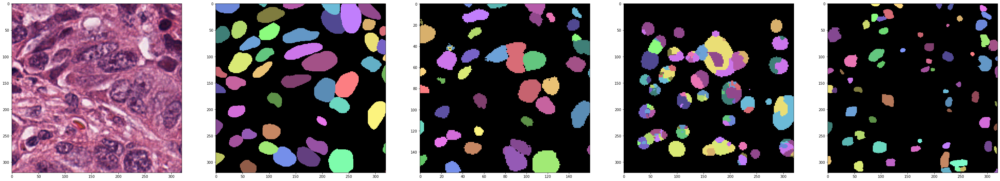

46


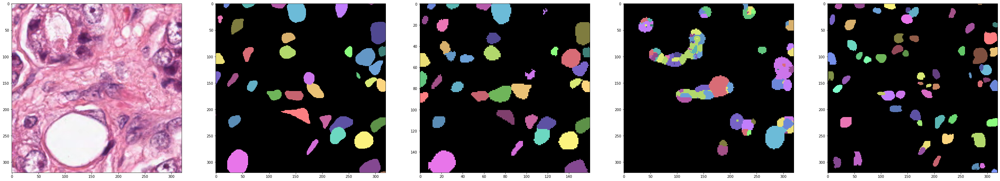

47


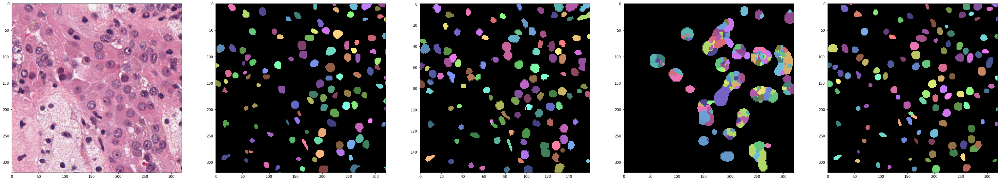

48


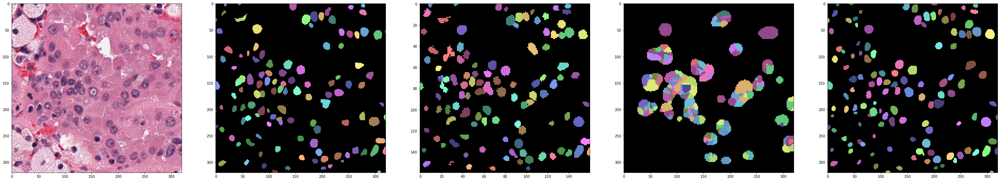

49


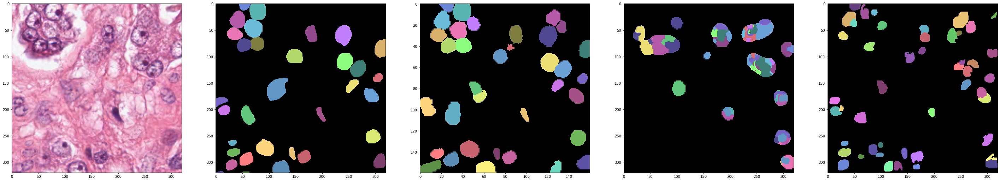

In [24]:
lbl2rgb = color_generator (200)
for idx in range (25, 50):
    print (idx)
    fig, ax = plt.subplots (1,5, figsize=(50,15))
    ax [0].imshow (em [idx])
    ax [1].imshow (lbl2rgb (gt [idx]))
    ax [2].imshow (lbl2rgb (post_processed [idx]))
    ax [3].imshow (lbl2rgb (rec [idx]))
    ax [4].imshow (lbl2rgb (maskrcnn[idx]))
    plt.show ()

In [23]:
result_dir = "160_monuseg_results"
rec_path = natsorted (glob ('/home/tuan/rec-attend-public-all/rec-monuseg-160/results/full_model_cvppp-20200816185847/output_valid/30/*.png')) [-len_test:]
print ('test', len (rec_path), len_test)
lbl2rgb = color_generator (200)
res = [graphcl, rec, maskrcnn, gt, em]
meds = ["graphcl", "rec", "maskrcnn", "gt", "em"]
for med, lbl_lists in zip (meds, res):
    med_dir = result_dir + "/" + med + '/'
    os.makedirs (med_dir, exist_ok=True)
    if med in ['rec', 'acis', 'em']:
        continue
    
    for i in range (len_test):
        io.imsave (med_dir + '/' + str (i) + '.png', lbl2rgb (lbl_lists [i]))

os.makedirs (result_dir + "/" + 'em' + '/', exist_ok=True)
for i in range (len_test):
    io.imsave (result_dir + '/em/' + str (i) + '.png', em[i])
    

for i in range (len_test):
    cmd = "cp " + rec_path [i] + ' ' + result_dir + '/rec/' + str (i) + '.png' 
    os.system (cmd)

/opt/conda/lib/python3.6/site-packages/skimage/util/dtype.py:135: UserWarning: Possible precision loss when converting from int64 to float64
  .format(dtypeobj_in, dtypeobj_out))
/opt/conda/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: 160_monuseg_results/graphcl//0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int64 to uint8. Range [0, 252]. Convert image to uint8 prior to saving to suppress this warning.
/opt/conda/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: 160_monuseg_results/graphcl//1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int64 to uint8. Range [0, 252]. Convert image to uint8 prior to saving to suppress this warning.
/opt/conda/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: 160_monuseg_results/graphcl//2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int64 to uint8. Range [0

test 100 100


/opt/conda/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: 160_monuseg_results/graphcl//3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int64 to uint8. Range [0, 252]. Convert image to uint8 prior to saving to suppress this warning.
/opt/conda/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: 160_monuseg_results/graphcl//4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int64 to uint8. Range [0, 252]. Convert image to uint8 prior to saving to suppress this warning.
/opt/conda/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: 160_monuseg_results/graphcl//5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
Lossy conversion from int64 to uint8. Range [0, 252]. Convert image to uint8 prior to saving to suppress this warning.
/opt/conda/lib/python3.6/site-packages/skimage/io/_io.py:141: UserWarning: 160_monuseg_results/graphcl//6.

In [22]:
print (result_dir + '/rec/')

160_monuseg_results/rec/
